In [1]:
from huggingface_hub import login
from google.colab import userdata

login(token=userdata.get('niru_hf_read'))

The token has not been saved to the git credentials helper. Pass `add_to_git_credential=True` in this function directly or `--add-to-git-credential` if using via `huggingface-cli` if you want to set the git credential as well.
Token is valid (permission: read).
Your token has been saved to /root/.cache/huggingface/token
Login successful


In [2]:
!git clone https://github.com/ostris/ai-toolkit

Cloning into 'ai-toolkit'...
remote: Enumerating objects: 3835, done.
remote: Counting objects: 100% (3834/3834), done.
remote: Compressing objects: 100% (928/928), done.
remote: Total 3835 (delta 2932), reused 3677 (delta 2819), pack-reused 1 (from 1)
Receiving objects: 100% (3835/3835), 29.63 MiB | 10.96 MiB/s, done.
Resolving deltas: 100% (2932/2932), done.


In [3]:
!cd ai-toolkit && git submodule update --init --recursive

Submodule 'repositories/batch_annotator' (https://github.com/ostris/batch-annotator) registered for path 'repositories/batch_annotator'
Submodule 'repositories/ipadapter' (https://github.com/tencent-ailab/IP-Adapter.git) registered for path 'repositories/ipadapter'
Submodule 'repositories/leco' (https://github.com/p1atdev/LECO) registered for path 'repositories/leco'
Submodule 'repositories/sd-scripts' (https://github.com/kohya-ss/sd-scripts.git) registered for path 'repositories/sd-scripts'
Cloning into '/content/ai-toolkit/repositories/batch_annotator'...
Cloning into '/content/ai-toolkit/repositories/ipadapter'...
Cloning into '/content/ai-toolkit/repositories/leco'...
Cloning into '/content/ai-toolkit/repositories/sd-scripts'...
Submodule path 'repositories/batch_annotator': checked out '420e142f6ad3cc14b3ea0500affc2c6c7e7544bf'
Submodule 'repositories/controlnet' (https://github.com/lllyasviel/ControlNet-v1-1-nightly.git) registered for path 'repositories/batch_annotator/repositor

In [ ]:
! pip install -r /content/ai-toolkit/requirements.txt

In [5]:
import os
from PIL import Image
import sys
import matplotlib.pyplot as plt
from torchvision import transforms
import torch
from PIL import Image
from diffusers import DDPMScheduler

In [6]:
sys.path.append('/content/ai-toolkit')
from toolkit.job import run_job

# Dataset

In [7]:
!mkdir -p /content/dataset

put your images data in dataset folder

# Model

In [8]:
from collections import OrderedDict

job_to_run = OrderedDict([
    ('job', 'extension'),
    ('config', OrderedDict([
        # this name will be the folder and filename name
        ('name', 'my_first_flux_lora_v1'),
        ('process', [
            OrderedDict([
                ('type', 'sd_trainer'),
                # root folder to save training weights
                ('training_folder', '/content/output'),
                ('device', 'cuda:0'),
                ('network', OrderedDict([
                    ('type', 'lora'),
                    ('linear', 16),
                    ('linear_alpha', 16)
                ])),
                ('save', OrderedDict([
                    ('dtype', 'float16'),  # precision to save
                    ('save_every', 250),
                    ('max_step_saves_to_keep', 4)
                ])),
                ('datasets', [
                    # datasets are a folder of images. captions need to be .txt files with the same name as the image
                    # images will automatically be resized and bucketed into the resolution specified
                    OrderedDict([
                        ('folder_path', '/content/dataset'),
                        ('caption_ext', 'txt'),
                        ('caption_dropout_rate', 0.05),  # will drop out the caption 5% of time
                        ('shuffle_tokens', False),
                        ('cache_latents_to_disk', True),
                        ('resolution', [512, 768, 1024])
                    ])
                ]),
                ('train', OrderedDict([
                    ('batch_size', 1),
                    ('steps', 2000),
                    ('gradient_accumulation_steps', 1),
                    ('train_unet', True),
                    ('train_text_encoder', False),  # probably won't work with flux
                    ('content_or_style', 'balanced'),
                    ('gradient_checkpointing', True),  # need the on unless you have a ton of vram
                    ('noise_scheduler', 'flowmatch'),  # for training only
                    ('optimizer', 'adamw8bit'),
                    ('lr', 4e-4),
                    # uncomment this to skip the pre training sample
                    #('skip_first_sample', True),

                    # ema will smooth out learning, but could slow it down. Recommended to leave on.
                    ('ema_config', OrderedDict([
                        ('use_ema', True),
                        ('ema_decay', 0.99)
                    ])),

                    ('dtype', 'bf16')
                ])),
                ('model', OrderedDict([
                    ('name_or_path', 'black-forest-labs/FLUX.1-dev'),
                    ('is_flux', True),
                    ('quantize', True),  # run 8bit mixed precision
                    #('low_vram', True),
                ])),
                ('sample', OrderedDict([
                    ('sampler', 'flowmatch'),  # must match train.noise_scheduler
                    ('sample_every', 250),  # sample every this many steps
                    ('width', 1024),
                    ('height', 1024),
                    ('prompts', [
                        'woman with red hair, playing chess at the park, bomb going off in the background',
                        'a woman holding a coffee cup, in a beanie, sitting at a cafe',
                        'a horse is a DJ at a night club, fish eye lens, smoke machine, lazer lights, holding a martini',
                        'a man showing off his cool new t shirt at the beach, a shark is jumping out of the water in the background',
                        'a bear building a log cabin in the snow covered mountains',
                        'woman playing the guitar, on stage, singing a song, laser lights, punk rocker',
                        'hipster man with a beard, building a chair, in a wood shop',
                        'photo of a man, white background, medium shot, modeling clothing, studio lighting, white backdrop',
                        'a man holding a sign that says, \'this is a sign\'',
                        'a bulldog, in a post apocalyptic world, with a shotgun, in a leather jacket, in a desert, with a motorcycle'
                    ]),
                    ('neg', ''),  # not used on flux
                    ('seed', 42),
                    ('walk_seed', True),
                    ('guidance_scale', 4),
                    ('sample_steps', 20)
                ]))
            ])
        ])
    ])),
    ('meta', OrderedDict([
        ('name', 'my_first_flux_lora_v1'),
        ('version', '1.0')
    ]))
])


In [9]:
run_job(job_to_run)

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.16 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/usr/local/lib/python3.10/dist-packages/controlnet_aux/mediapipe_face/mediapipe_face_common.py:7: UserWarning: The module 'mediapipe' is not installed. The package will have limited functionality. Please install it using the command: pip install 'mediapipe'
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/controlnet_aux/segment_anything/modeling/tiny_vit_sam.py:654: UserWarning: Overwriting tiny_vit_5m_224 in registry with controlnet_aux.segment_anything.modeling.tiny_vit_sam.tiny_vit_5m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/usr/local/lib/python3.10

{
    "type": "sd_trainer",
    "training_folder": "/content/output",
    "device": "cuda:0",
    "network": {
        "type": "lora",
        "linear": 16,
        "linear_alpha": 16
    },
    "save": {
        "dtype": "float16",
        "save_every": 250,
        "max_step_saves_to_keep": 4
    },
    "datasets": [
        {
            "folder_path": "/content/dataset",
            "caption_ext": "txt",
            "caption_dropout_rate": 0.05,
            "shuffle_tokens": false,
            "cache_latents_to_disk": true,
            "resolution": [
                512,
                768,
                1024
            ]
        }
    ],
    "train": {
        "batch_size": 1,
        "steps": 2000,
        "gradient_accumulation_steps": 1,
        "train_unet": true,
        "train_text_encoder": false,
        "content_or_style": "balanced",
        "gradient_checkpointing": true,
        "noise_scheduler": "flowmatch",
        "optimizer": "adamw8bit",
        "lr": 0.0004

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


transformer/config.json:   0%|          | 0.00/378 [00:00<?, ?B/s]

(…)ion_pytorch_model.safetensors.index.json:   0%|          | 0.00/121k [00:00<?, ?B/s]

Fetching 3 files:   0%|          | 0/3 [00:00<?, ?it/s]

(…)pytorch_model-00002-of-00003.safetensors:   0%|          | 0.00/9.95G [00:00<?, ?B/s]

(…)pytorch_model-00003-of-00003.safetensors:   0%|          | 0.00/3.87G [00:00<?, ?B/s]

(…)pytorch_model-00001-of-00003.safetensors:   0%|          | 0.00/9.98G [00:00<?, ?B/s]

Quantizing transformer


scheduler/scheduler_config.json:   0%|          | 0.00/274 [00:00<?, ?B/s]

Loading vae


vae/config.json:   0%|          | 0.00/774 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/168M [00:00<?, ?B/s]

Loading t5


tokenizer_2/tokenizer_config.json:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer_2/tokenizer.json:   0%|          | 0.00/2.42M [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/2.54k [00:00<?, ?B/s]

You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers


text_encoder_2/config.json:   0%|          | 0.00/782 [00:00<?, ?B/s]

(…)t_encoder_2/model.safetensors.index.json:   0%|          | 0.00/19.9k [00:00<?, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/4.99G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/4.53G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Quantizing T5
Loading clip


text_encoder/config.json:   0%|          | 0.00/613 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/705 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/588 [00:00<?, ?B/s]

making pipe
preparing
create LoRA network. base dim (rank): 16, alpha: 16
neuron dropout: p=None, rank dropout: p=None, module dropout: p=None
create LoRA for Text Encoder: 0 modules.
create LoRA for U-Net: 494 modules.
enable LoRA for U-Net
Dataset: /content/dataset
  -  Preprocessing image dimensions


100%|██████████| 39/39 [00:00<00:00, 12792.51it/s]

  -  Found 39 images
Bucket sizes for /content/dataset:
384x576: 11 files
448x576: 17 files
448x512: 4 files
384x640: 4 files
512x512: 1 files
512x448: 1 files
192x256: 1 files
7 buckets made
Caching latents for /content/dataset
 - Saving latents to disk



Caching latents to disk: 100%|██████████| 39/39 [00:02<00:00, 13.37it/s]


Dataset: /content/dataset
  -  Preprocessing image dimensions


100%|██████████| 39/39 [00:00<00:00, 31707.28it/s]

  -  Found 39 images
Bucket sizes for /content/dataset:
512x768: 6 files
640x768: 12 files
512x576: 1 files
512x640: 6 files
576x960: 2 files
512x896: 2 files
576x832: 2 files
640x832: 1 files
512x704: 3 files
704x704: 1 files
512x448: 1 files
448x640: 1 files
192x256: 1 files
13 buckets made
Caching latents for /content/dataset
 - Saving latents to disk



Caching latents to disk: 100%|██████████| 39/39 [00:02<00:00, 17.07it/s]


Dataset: /content/dataset
  -  Preprocessing image dimensions


100%|██████████| 39/39 [00:00<00:00, 41151.66it/s]

  -  Found 39 images
Bucket sizes for /content/dataset:
512x768: 6 files
704x896: 6 files
512x576: 1 files
512x640: 6 files
640x832: 1 files
704x832: 5 files
704x1280: 2 files
512x896: 2 files
704x1024: 2 files
512x704: 3 files
704x704: 1 files
512x448: 1 files
448x640: 1 files
896x1088: 1 files
192x256: 1 files
15 buckets made
Caching latents for /content/dataset
 - Saving latents to disk



Caching latents to disk: 100%|██████████| 39/39 [00:01<00:00, 24.71it/s]


Generating baseline samples before training


my_first_flux_lora_v1:   0%|          | 0/2000 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:1399: FutureWarning: `torch.cpu.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cpu', args...)` instead.
  with device_autocast_ctx, torch.cpu.amp.autocast(**cpu_autocast_kwargs), recompute_context:  # type: ignore[attr-defined]
my_first_flux_lora_v1:  12%|█▏        | 249/2000 [08:02<1:00:16,  2.07s/it, lr: 4.0e-04 loss: 4.486e-01]

Saving at step 250


my_first_flux_lora_v1:  12%|█▏        | 249/2000 [08:04<1:00:16,  2.07s/it, lr: 4.0e-04 loss: 4.486e-01]

Saved to /content/output/my_first_flux_lora_v1/optimizer.pt


my_first_flux_lora_v1:  25%|██▍       | 499/2000 [16:02<48:02,  1.92s/it, lr: 4.0e-04 loss: 3.322e-01]

Saving at step 500


my_first_flux_lora_v1:  25%|██▍       | 499/2000 [16:04<48:02,  1.92s/it, lr: 4.0e-04 loss: 3.322e-01]

Saved to /content/output/my_first_flux_lora_v1/optimizer.pt


my_first_flux_lora_v1:  37%|███▋      | 749/2000 [24:06<40:56,  1.96s/it, lr: 4.0e-04 loss: 3.771e-01]

Saving at step 750


my_first_flux_lora_v1:  37%|███▋      | 749/2000 [24:08<40:56,  1.96s/it, lr: 4.0e-04 loss: 3.771e-01]

Saved to /content/output/my_first_flux_lora_v1/optimizer.pt


my_first_flux_lora_v1:  50%|████▉     | 999/2000 [32:09<32:31,  1.95s/it, lr: 4.0e-04 loss: 4.516e-01]

Saving at step 1000


my_first_flux_lora_v1:  50%|████▉     | 999/2000 [32:11<32:31,  1.95s/it, lr: 4.0e-04 loss: 4.516e-01]

Saved to /content/output/my_first_flux_lora_v1/optimizer.pt


my_first_flux_lora_v1:  62%|██████▏   | 1249/2000 [40:09<22:54,  1.83s/it, lr: 4.0e-04 loss: 5.635e-01]

Saving at step 1250


my_first_flux_lora_v1:  62%|██████▏   | 1249/2000 [40:12<22:54,  1.83s/it, lr: 4.0e-04 loss: 5.635e-01]

Saved to /content/output/my_first_flux_lora_v1/optimizer.pt
Removing old save: /content/output/my_first_flux_lora_v1/my_first_flux_lora_v1_000000250.safetensors


my_first_flux_lora_v1:  75%|███████▍  | 1499/2000 [48:17<16:05,  1.93s/it, lr: 4.0e-04 loss: 6.273e-01]

Saving at step 1500


my_first_flux_lora_v1:  75%|███████▍  | 1499/2000 [48:20<16:05,  1.93s/it, lr: 4.0e-04 loss: 6.273e-01]

Saved to /content/output/my_first_flux_lora_v1/optimizer.pt
Removing old save: /content/output/my_first_flux_lora_v1/my_first_flux_lora_v1_000000500.safetensors


my_first_flux_lora_v1:  87%|████████▋ | 1749/2000 [56:40<09:18,  2.22s/it, lr: 4.0e-04 loss: 5.439e-01]

Saving at step 1750


my_first_flux_lora_v1:  87%|████████▋ | 1749/2000 [56:42<09:18,  2.22s/it, lr: 4.0e-04 loss: 5.439e-01]

Saved to /content/output/my_first_flux_lora_v1/optimizer.pt
Removing old save: /content/output/my_first_flux_lora_v1/my_first_flux_lora_v1_000000750.safetensors


my_first_flux_lora_v1: 100%|█████████▉| 1999/2000 [1:04:59<00:01,  1.95s/it, lr: 4.0e-04 loss: 4.590e-01]



Saved to /content/output/my_first_flux_lora_v1/optimizer.pt


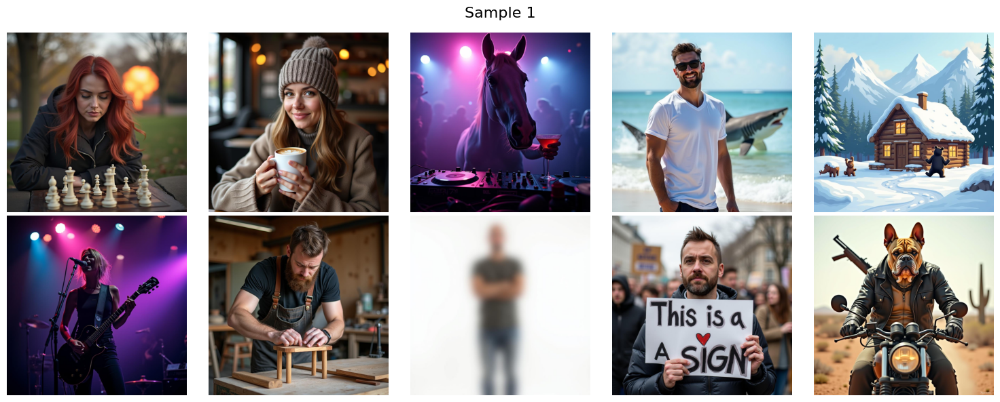

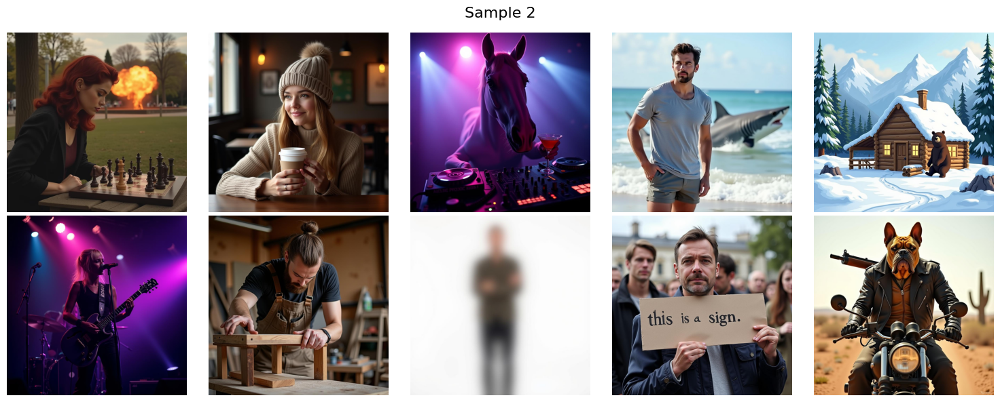

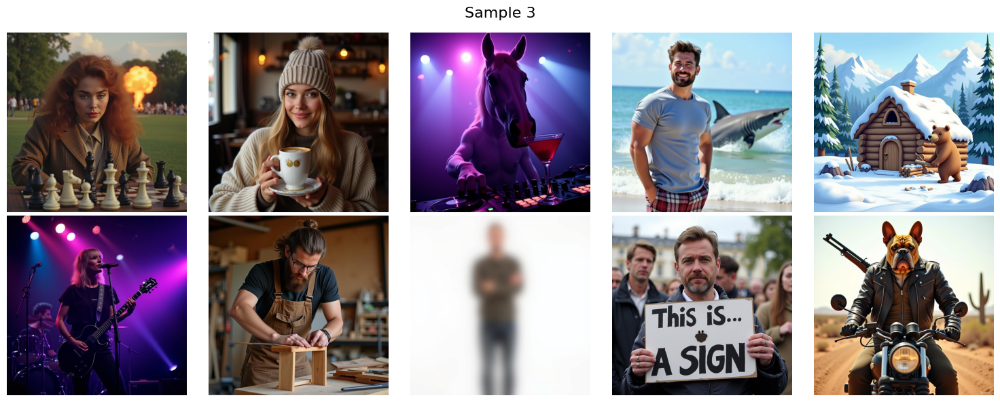

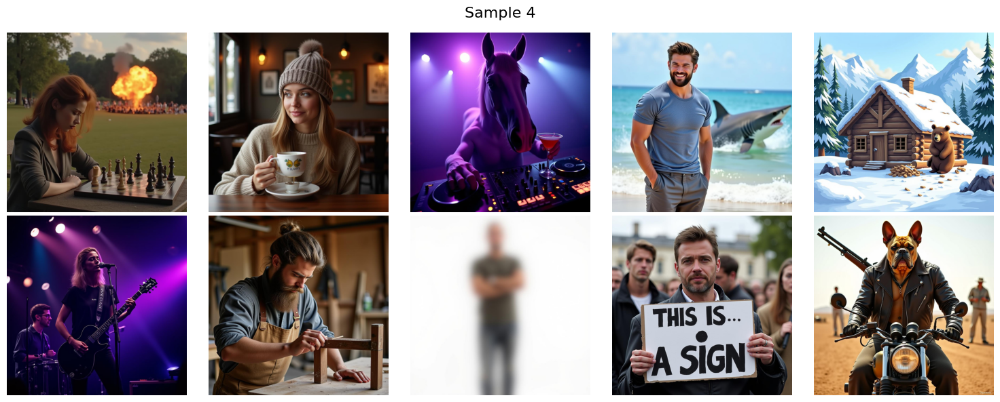

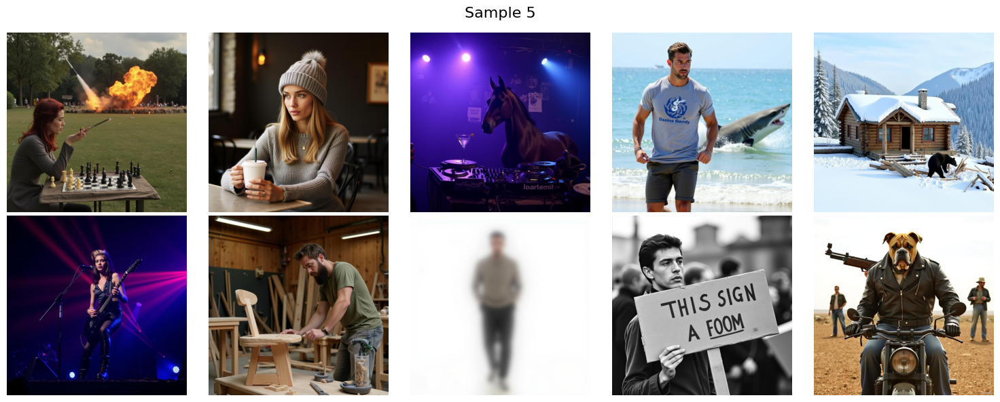

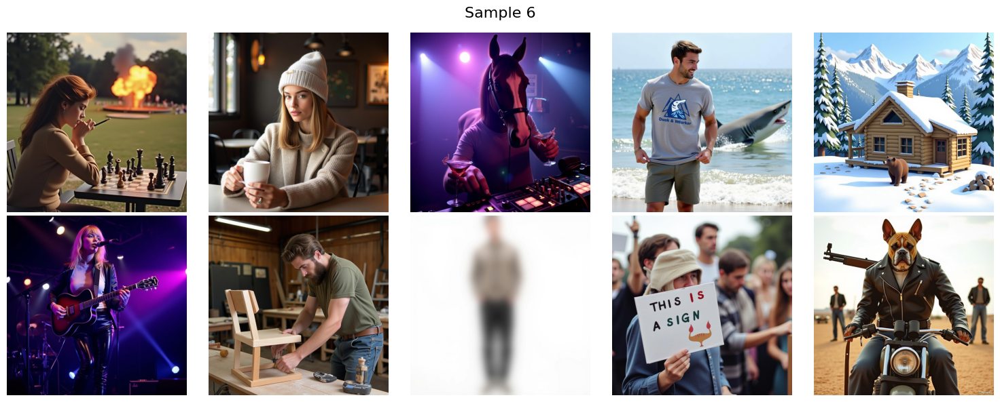

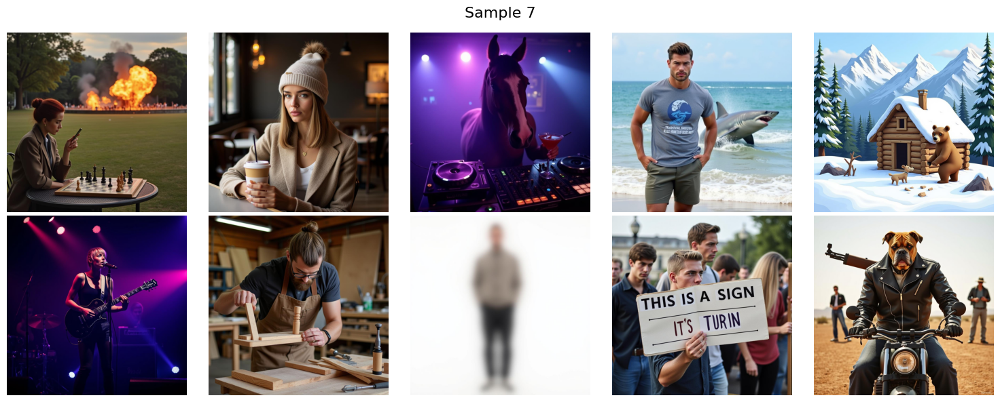

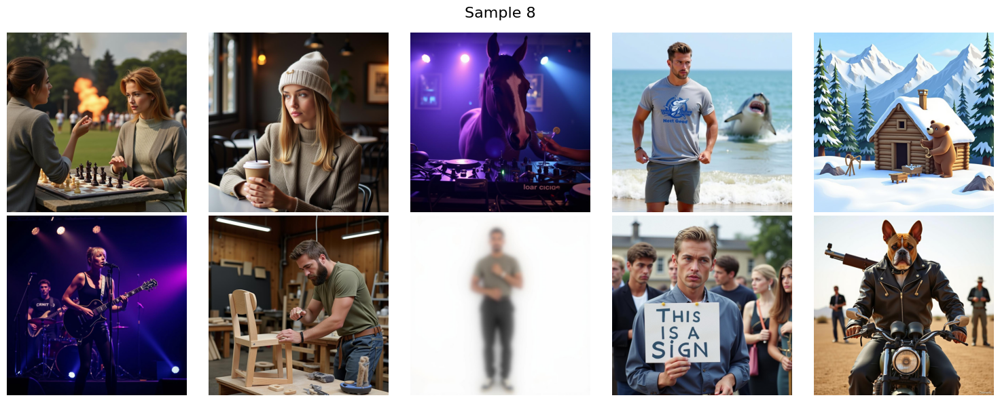

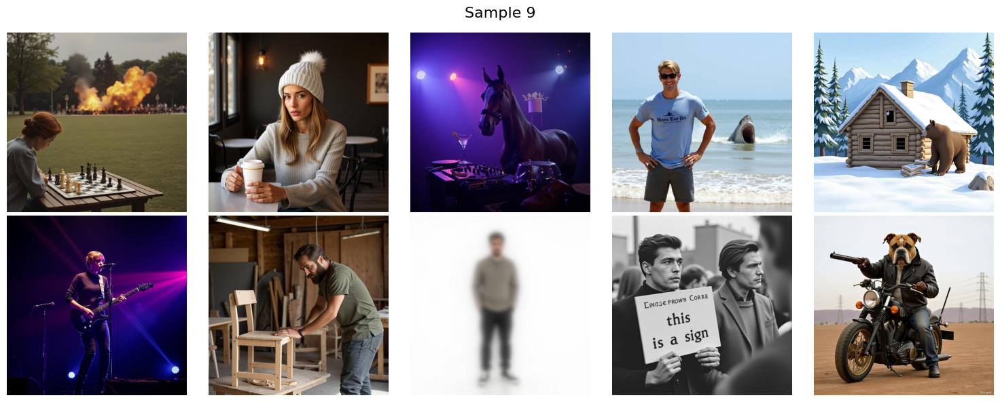

In [13]:
import os
import matplotlib.pyplot as plt
from PIL import Image


image_dir = '/content/output/my_first_flux_lora_v1/samples'

image_files = sorted([f for f in os.listdir(image_dir) if f.endswith(('png', 'jpg', 'jpeg'))])

images_per_category = 10
num_categories = len(image_files) // images_per_category

# Loop through each category (group of 10 images)
for category in range(num_categories):
    start_idx = category * images_per_category
    end_idx = start_idx + images_per_category
    category_images = image_files[start_idx:end_idx]

    num_columns = 5
    num_rows = 2

    plt.figure(figsize=(15, 6))

    for i, image_file in enumerate(category_images):
        # Load the image
        img = Image.open(os.path.join(image_dir, image_file))
        plt.subplot(num_rows, num_columns, i + 1)

        plt.imshow(img)
        plt.axis('off')

    plt.suptitle(f'Sample {category + 1}', fontsize=16)

    plt.tight_layout()

    plt.show()


In [14]:
from google.colab import userdata
from huggingface_hub import login, HfApi, create_repo

In [19]:
login(token=userdata.get('niru_hf_write'))

api = HfApi()

model_id = "nirusanan/flux_fineTune_v1"

api.create_repo(model_id, exist_ok=True, repo_type="model")

api.upload_file(
    path_or_fileobj="/content/flux_lora_v1/my_first_flux_lora_v1_000001750.safetensors",
    path_in_repo="flux_fineTune_v1",
    repo_id=model_id,
)

api.upload_file(
    path_or_fileobj="/content/flux_lora_v1/optimizer.pt",
    path_in_repo="flux_fineTune_v1",
    repo_id=model_id,
)

The token has not been saved to the git credentials helper. Pass `add_to_git_credential=True` in this function directly or `--add-to-git-credential` if using via `huggingface-cli` if you want to set the git credential as well.
Token is valid (permission: write).
Your token has been saved to /root/.cache/huggingface/token
Login successful


my_first_flux_lora_v1_000001750.safetensors:   0%|          | 0.00/172M [00:00<?, ?B/s]

optimizer.pt:   0%|          | 0.00/176M [00:00<?, ?B/s]

CommitInfo(commit_url='https://huggingface.co/nirusanan/flux_fineTune_v1/commit/daf207f79bd0bfe3fc9c9e4d6181271dfc707efd', commit_message='Upload flux_fineTune_v1 with huggingface_hub', commit_description='', oid='daf207f79bd0bfe3fc9c9e4d6181271dfc707efd', pr_url=None, pr_revision=None, pr_num=None)